In [76]:
import core.deconV as dV
from core.base import NSM, MSEM
import core.plot as pl

import glob, tqdm, time, os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D

import matplotlib
from matplotlib_venn import venn2, venn3
import matplotlib.pyplot as plt
from matplotlib import rcParams

import pandas as pd
import numpy as np
import scanpy as sc
import scvi
import seaborn as sns
import tqdm

from scipy.optimize import curve_fit

In [43]:
dV.params = {
    "jupyter": True,
    "tqdm": True,
    "cell_type_key": "cellType",
    "layer": "ncounts",
    "index_col": 0,
    "selected_ct": ["alpha", "delta", "gamma", "beta"],
    # "selected_ct": ["0", "1", "2"],
    "model_type": "prob",
    "ignore_others": True,
    "n_top_genes": -1,
    "plot_pseudo_bulk": False,
    "lr": 0.01,
    "epochs": 5000,
    "fig_fmt": "png",
    "indir": "../../data/xin/",
    # "indir": "../../data/GSE136148/",
    "outdir": "out",
    "figsize": (8,8),
    "dpi": 80,
}

sc.settings.set_figure_params(dpi=80, facecolor='white')
plt.rc("patch", edgecolor="black", facecolor="royalblue", linewidth=1.0)
plt.rc("axes", facecolor="white", edgecolor="black", linewidth=1.0)

In [44]:
sadata = dV.read_data(os.path.join(dV.params["indir"], "sc.tsv"))
print(f"scRNA-seq data - cells: {sadata.shape[0]}, genes: {sadata.shape[1]}")

scRNA-seq data - cells: 1097, genes: 25453


In [45]:
print("Reading bulk data...")
badata = dV.read_data(os.path.join(dV.params["indir"], "bulk.tsv"), is_bulk=True)
print(f"bulk RNA-seq data - samples: {badata.shape[0]}, genes: {badata.shape[1]}")

Reading bulk data...
bulk RNA-seq data - samples: 18, genes: 39849


In [46]:
print("Reading pheno data...")
pheno_df = pd.read_csv(os.path.join(dV.params["indir"], "pdata.tsv"), sep="\t", index_col=dV.params["index_col"])
pheno_df.index.name = None

sadata.obs = pd.concat([sadata.obs, pheno_df], axis=1)
assert dV.params["cell_type_key"] in sadata.obs.columns, f"{dV.params['cell_type_key']} not in obs columns"
sadata.obs[dV.params["cell_type_key"]] = sadata.obs[dV.params["cell_type_key"]].astype(str)
sadata.obs

Reading pheno data...


,sampleID,SubjectName,cellTypeID,cellType
AZ_A10,1,Non T2D 1,5,delta
AZ_A11,1,Non T2D 1,2,alpha
AZ_A12,1,Non T2D 1,5,delta
AZ_A2,1,Non T2D 1,9,gamma
AZ_A5,1,Non T2D 1,6,ductal
...,...,...,...,...
HP1509101_P23,8,Non T2D 6,13,PSC
HP1509101_P4,8,Non T2D 6,2,alpha
HP1509101_P7,8,Non T2D 6,4,co-expression
HP1509101_P8,8,Non T2D 6,6,ductal


In [47]:
print("Preprocessing data...")
sadata, badata = dV.preprocess(sadata, badata)
print("After preprocessing:")
print(f"scRNA-seq data - cells: {sadata.shape[0]}, genes: {sadata.shape[1]}")
print(f"bulk RNA-seq data - samples: {badata.shape[0]}, genes: {badata.shape[1]}")

assert sadata.shape[1] == badata.shape[1], "scRNA-seq and bulk RNA-seq data have different number of genes"

Preprocessing data...
After preprocessing:
scRNA-seq data - cells: 748, genes: 17390
bulk RNA-seq data - samples: 18, genes: 17390


In [48]:
cell_types = list(sadata.obs[dV.params['cell_type_key']].unique())
cell_types

['delta', 'alpha', 'gamma', 'beta']

In [49]:
decon = dV.DeconV(sadata, badata, cell_types, dV.params, use_sub_types=False)

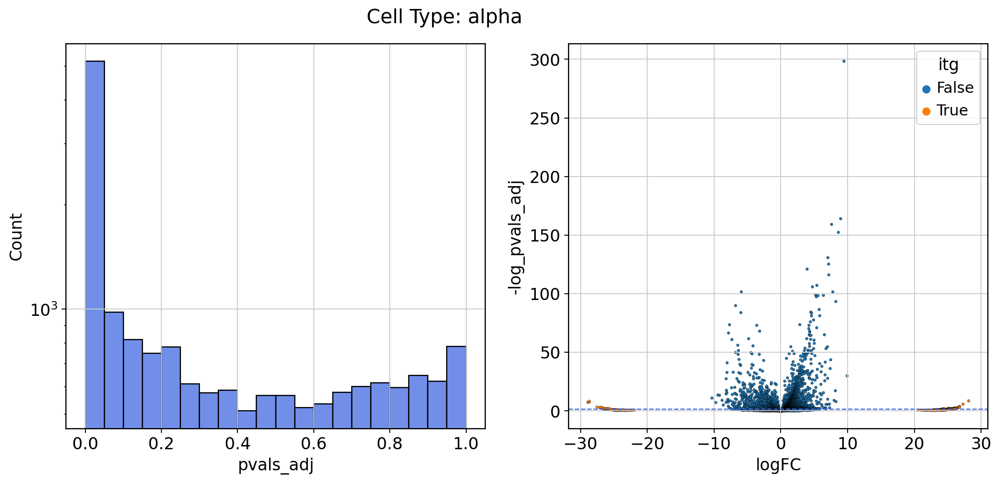

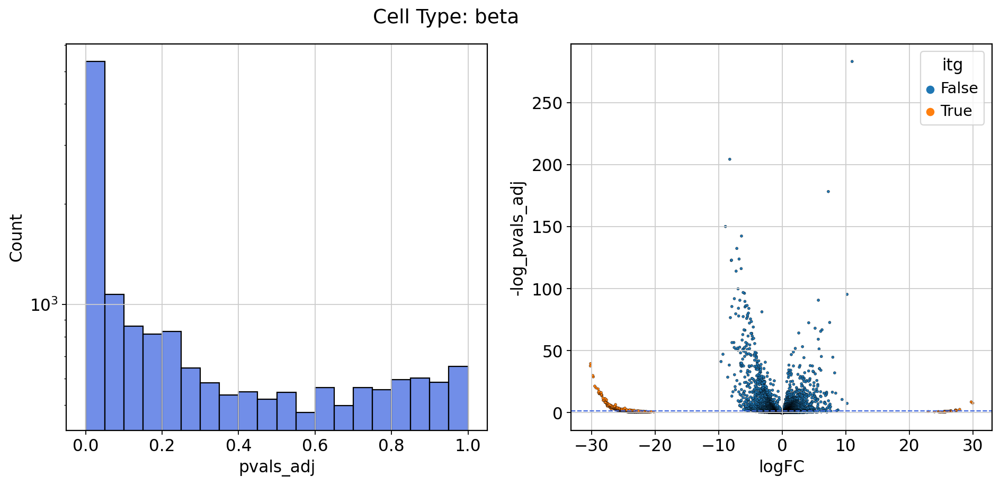

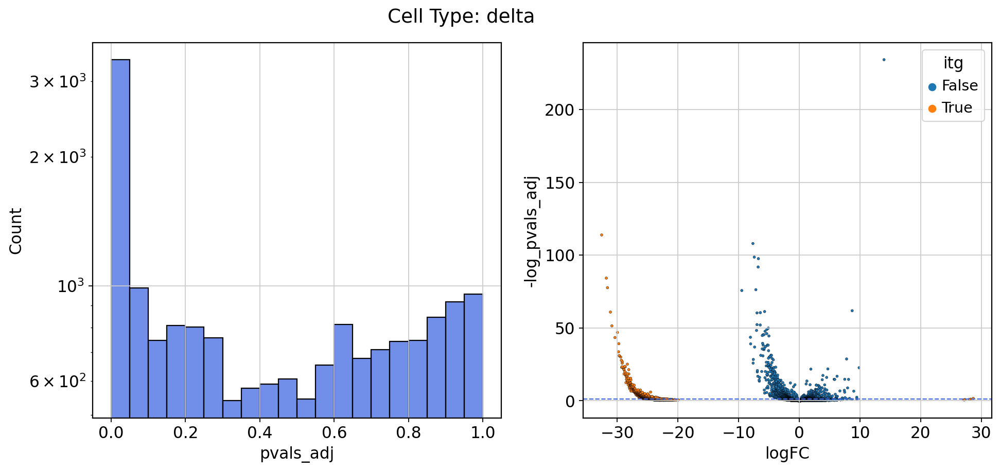

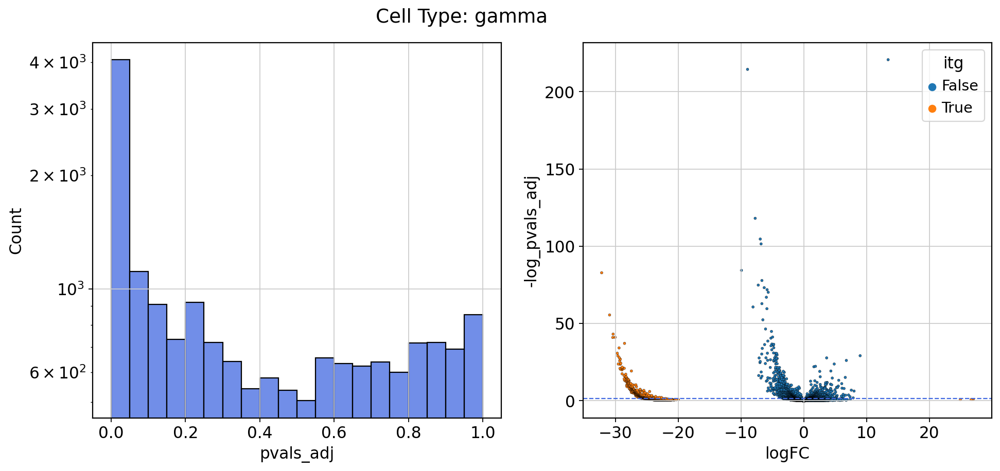

In [50]:
for ct in sorted(cell_types):
    f, ax = plt.subplots(1,2, figsize=(14,6))
    plt.suptitle("Cell Type: {}".format(ct))
    decon.sadata.uns["ranked_genes"][ct]["itg"] = abs(decon.sadata.uns["ranked_genes"][ct]["logFC"]) > 15
    sns.histplot(data=decon.sadata.uns["ranked_genes"][ct], x="pvals_adj", ax=ax[0], bins=20)
    ax[0].set_yscale("log")
    sns.scatterplot(data=decon.sadata.uns["ranked_genes"][ct], x="logFC", y="-log_pvals_adj", hue="itg", s=5, edgecolor=(0,0,0,1), color=(1,1,1,0), ax=ax[1], linewidth=0.2)
    ax[1].axhline(-np.log10(0.05), linestyle="--", color="royalblue", linewidth=1)
    plt.show()

In [51]:
set0 = set(decon.sadata.uns["ranked_genes"]["0"].index[decon.sadata.uns["ranked_genes"]["0"]["itg"]])
set1 = set(decon.sadata.uns["ranked_genes"]["1"].index[decon.sadata.uns["ranked_genes"]["1"]["itg"]])
set2 = set(decon.sadata.uns["ranked_genes"]["2"].index[decon.sadata.uns["ranked_genes"]["2"]["itg"]])

venn3([set0, set1, set2], set_labels=["0", "1", "2"])
plt.show()

KeyError: '0'

In [ ]:
decon.sadata.var["itg_and"] = decon.sadata.uns["ranked_genes"]["0"].loc[decon.sadata.var.index]["itg"] & decon.sadata.uns["ranked_genes"]["1"].loc[decon.sadata.var.index]["itg"] & decon.sadata.uns["ranked_genes"]["2"].loc[decon.sadata.var.index]["itg"]
decon.sadata.var["itg_or"] = decon.sadata.uns["ranked_genes"]["0"].loc[decon.sadata.var.index]["itg"] | decon.sadata.uns["ranked_genes"]["1"].loc[decon.sadata.var.index]["itg"] | decon.sadata.uns["ranked_genes"]["2"].loc[decon.sadata.var.index]["itg"]

In [58]:
# decon.filter_outliers(dropout_mu_lim=2.5, dropout_lim=1.0, marker_zscore_lim=0.3, dispersion_lims=(-3, 1), pseudobulk_lims=(-8,8))
decon.filter_outliers(pseudobulk_lims=(-5, 5))

In [59]:
decon.sadata.var["pseudo_residual"] = np.log1p(decon.sadata.var["bulk_0"]) - np.log1p(decon.sadata.var["pseudo"])
decon.sadata.var["psg"] = abs(decon.sadata.var["pseudo_residual"]) > 2.0

In [63]:
((decon.sadata.var["log_bulk_residual"] < -5) | (decon.sadata.var["log_bulk_residual"] > 5))

1292

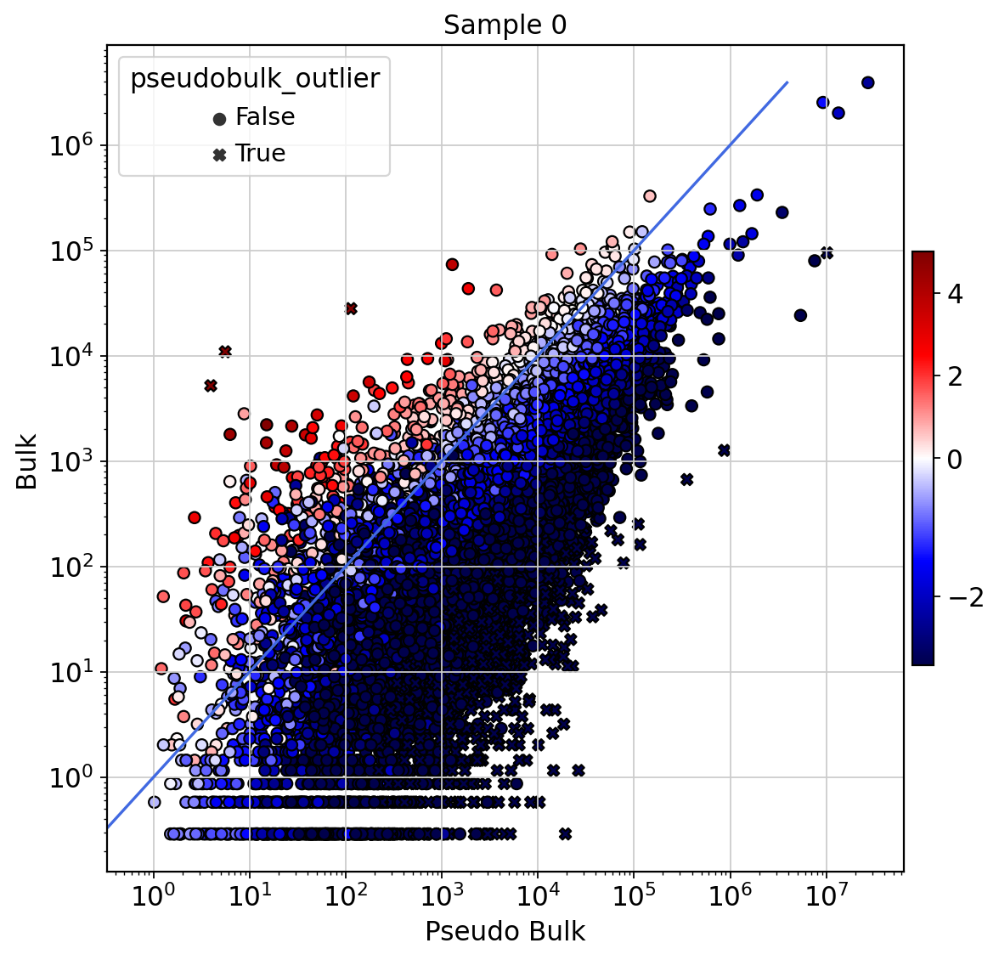

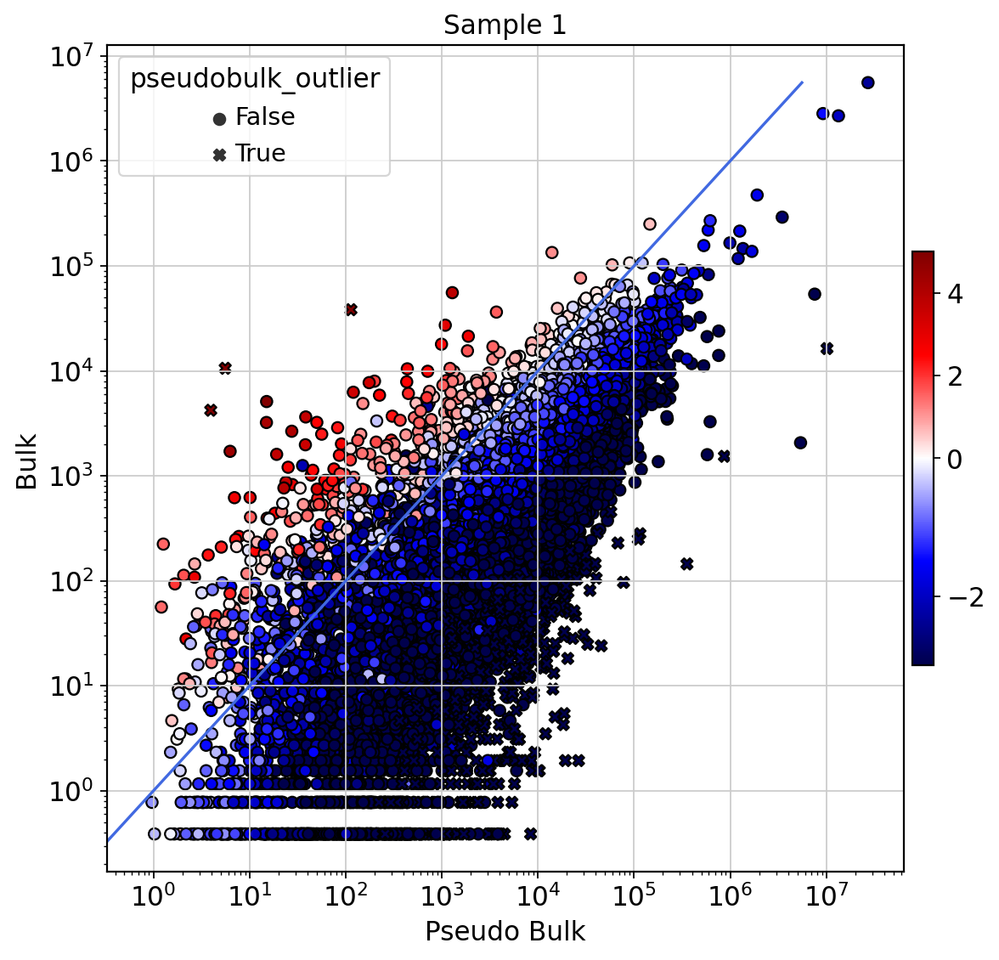

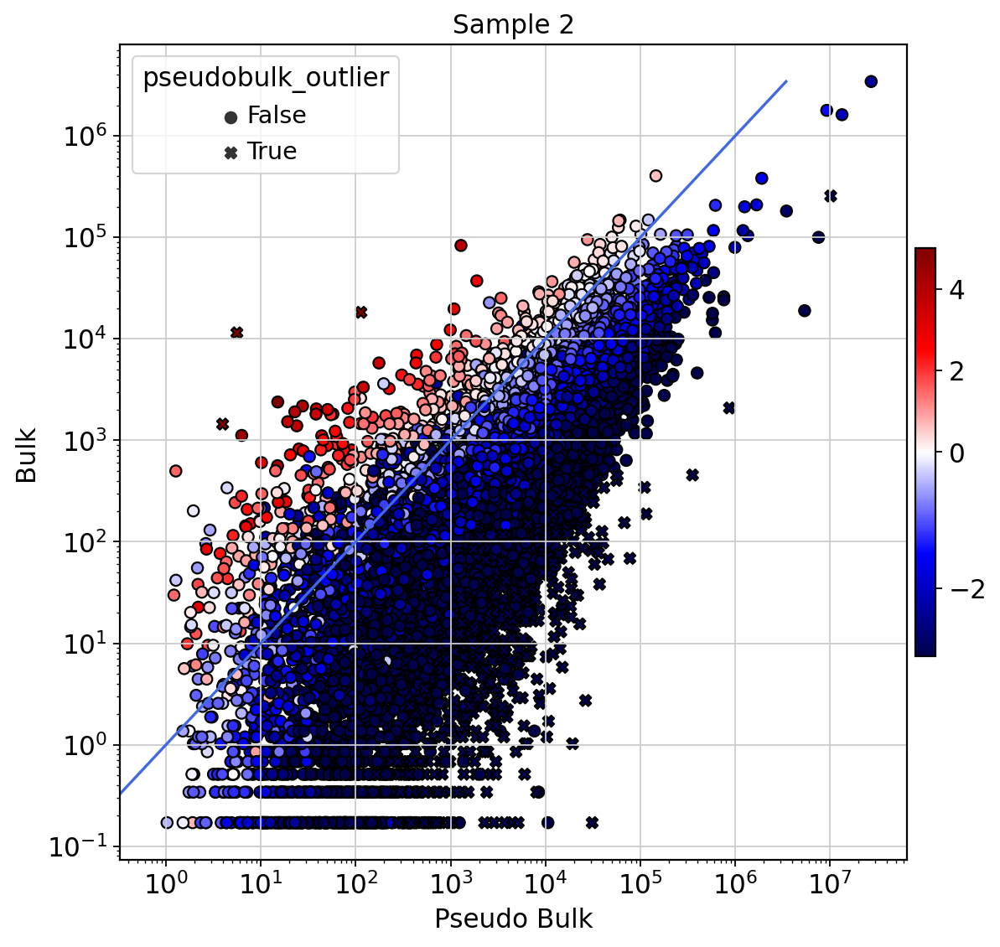

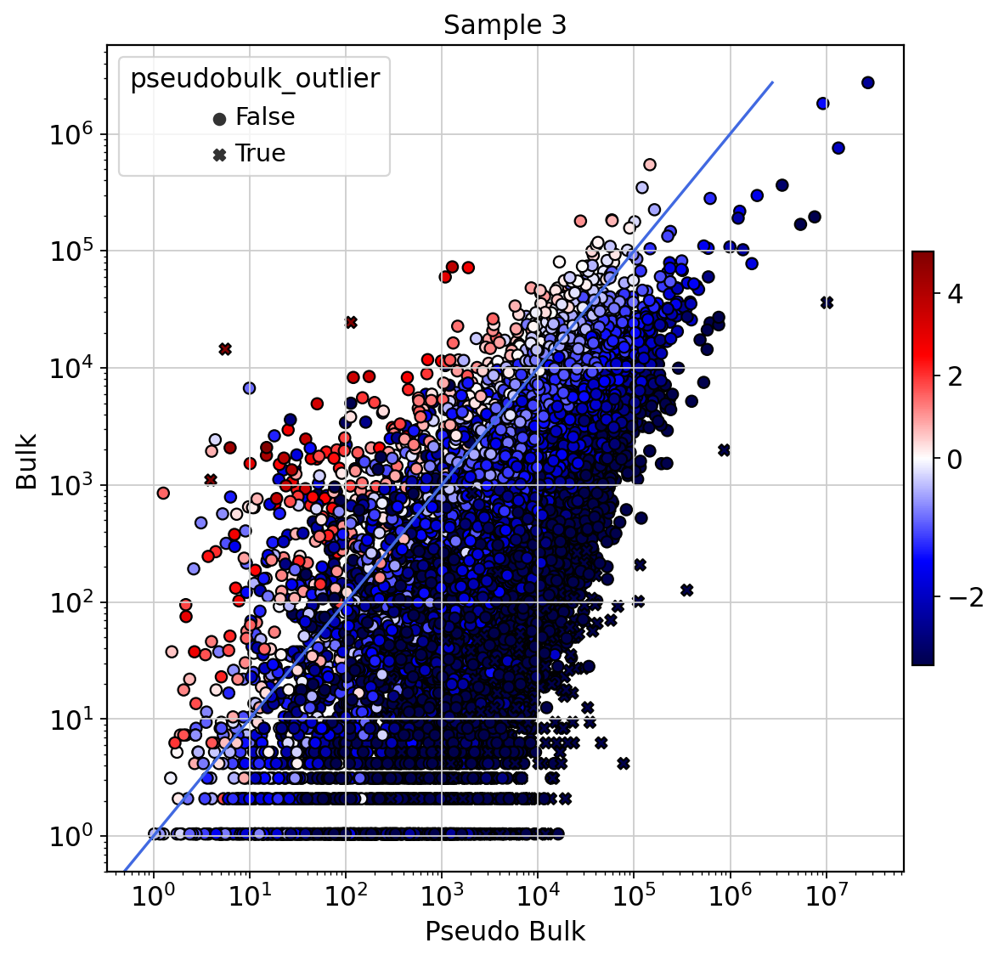

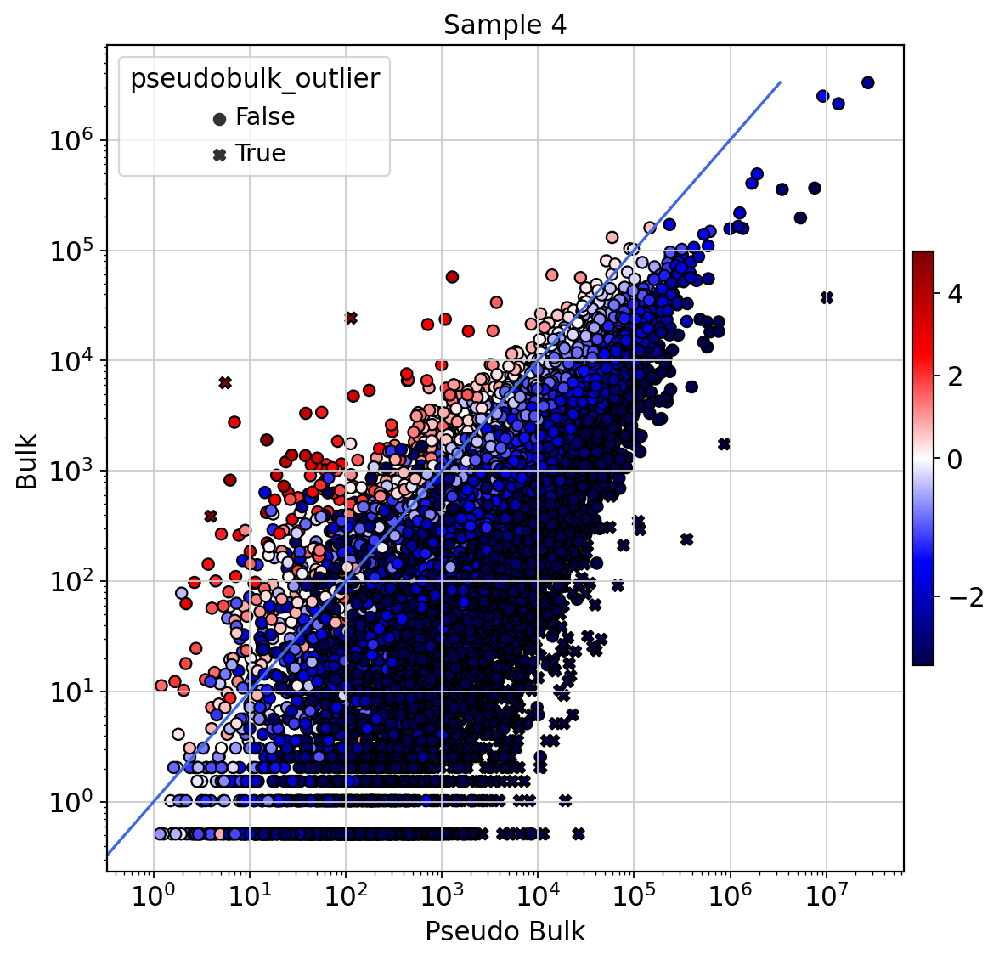

...

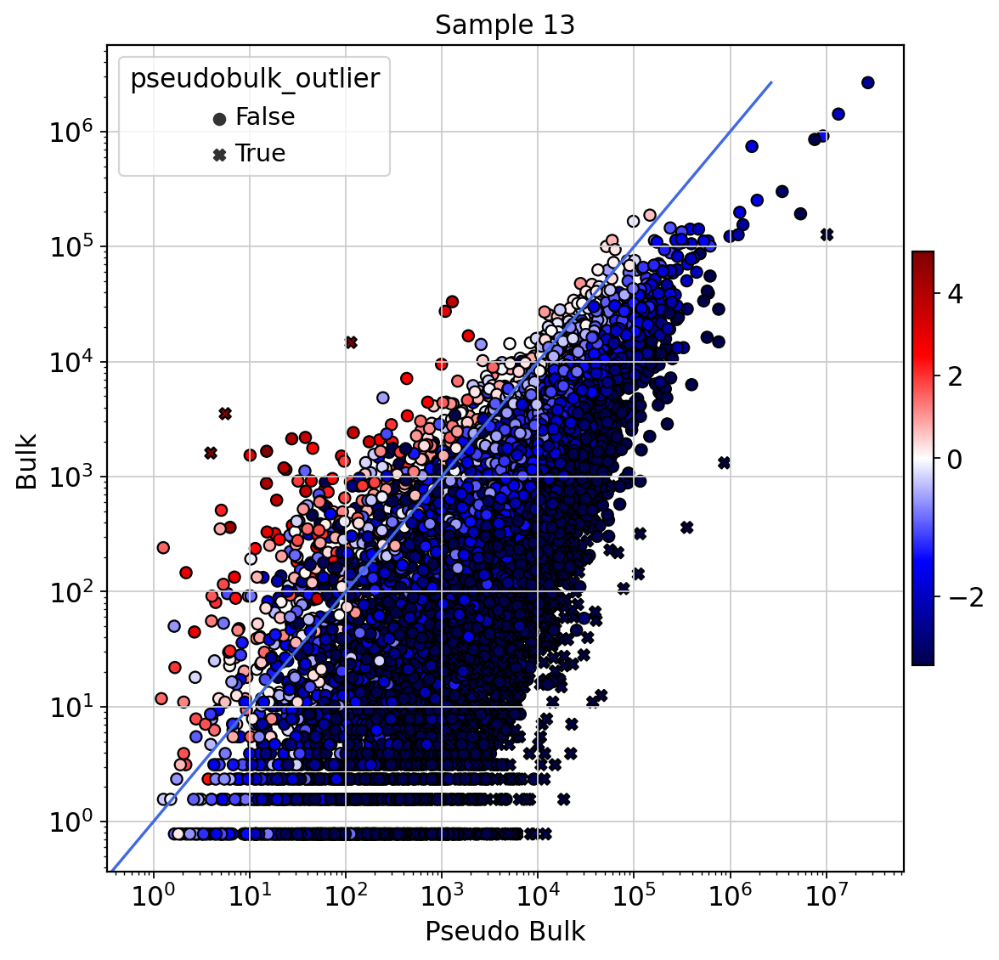

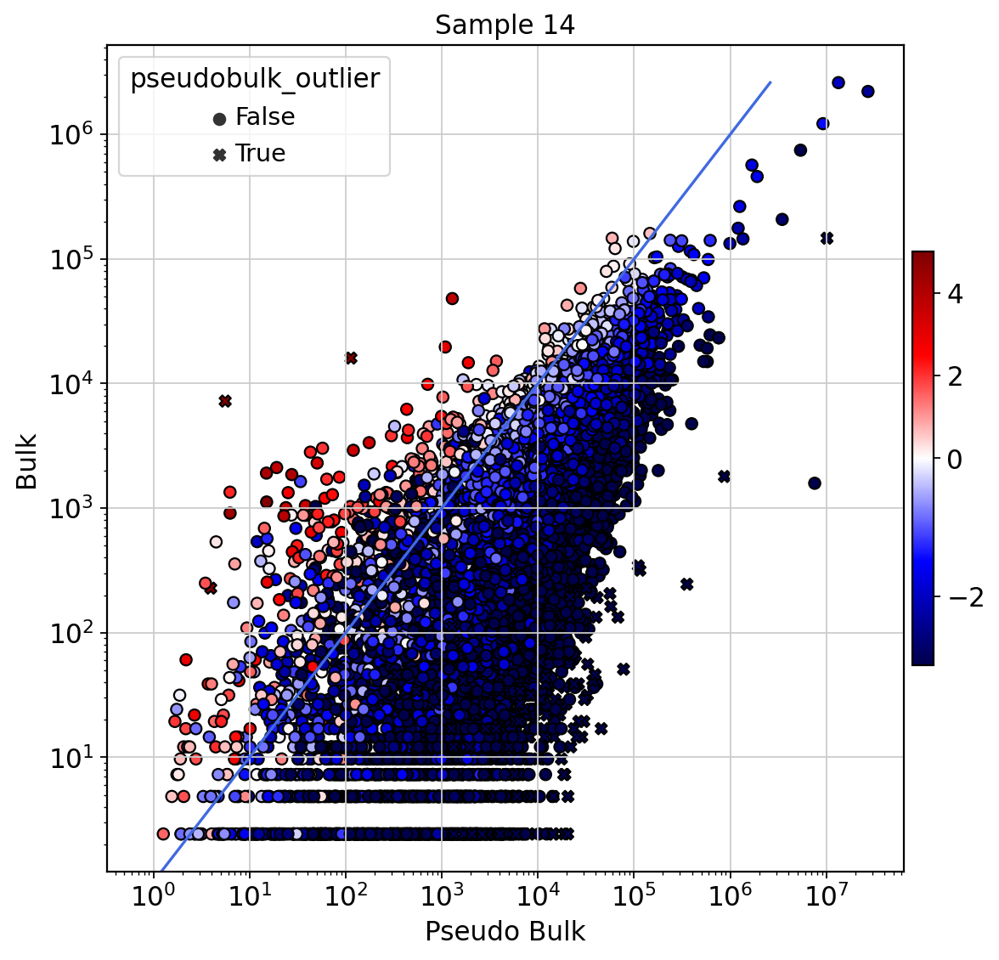

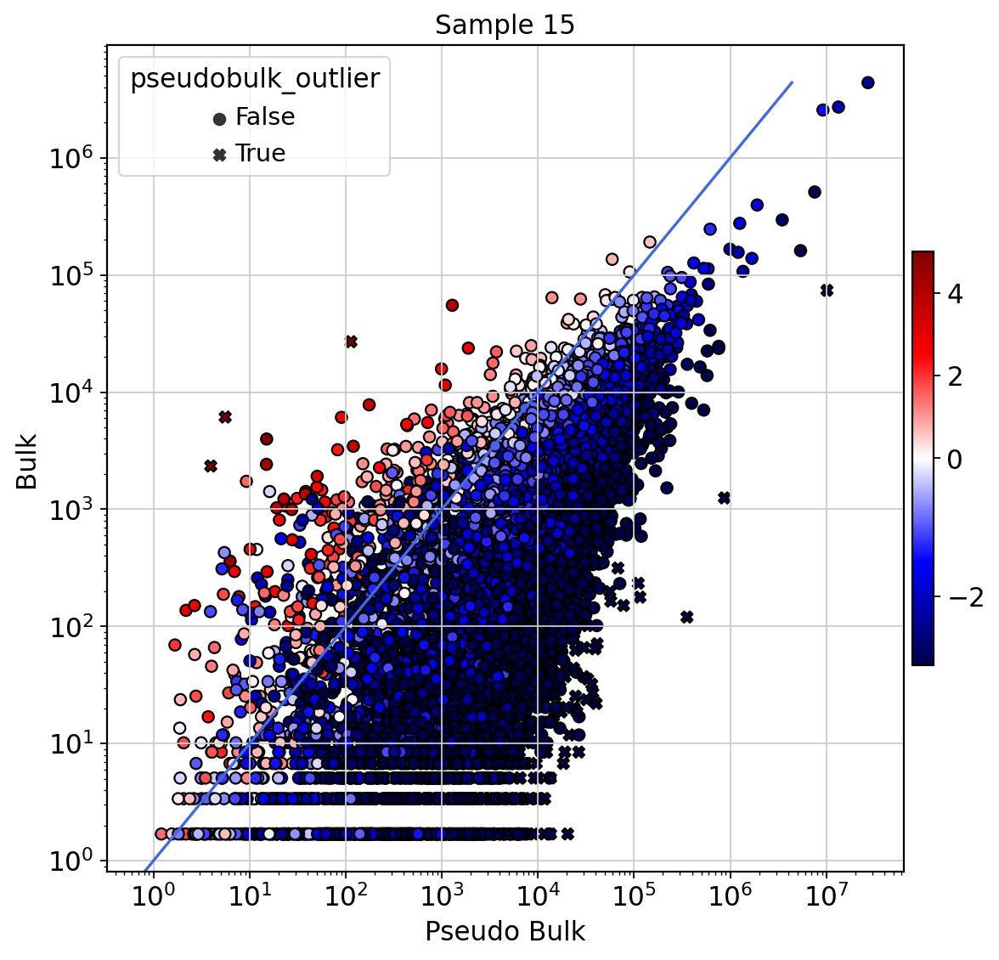

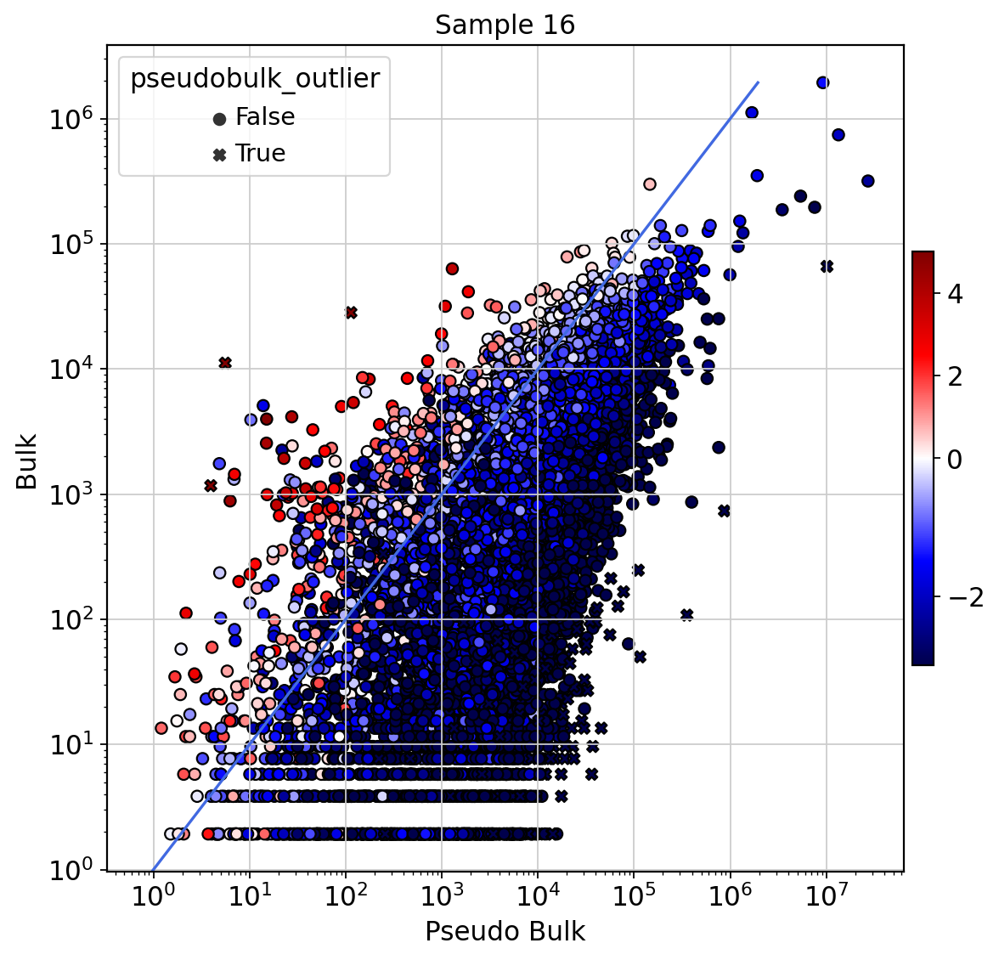

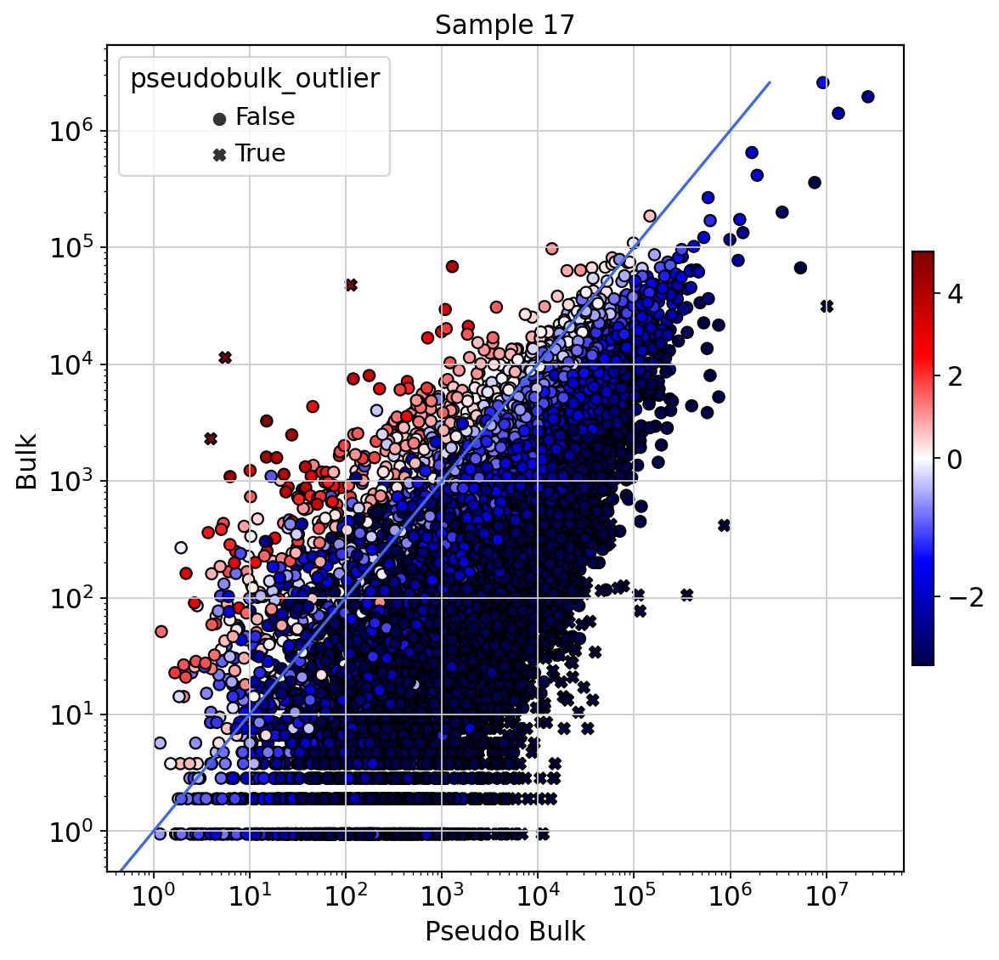

In [60]:
pl.pseudo_bulk_plot(
    decon, style="pseudobulk_outlier", vcenter=0.0, vmin=-3, vmax=5
)

In [85]:
with open("../../data/pseudo_outliers.csv", "w") as f:
    for i in range(decon.badata.shape[0]):
        f.write(", ".join(list(decon.sadata.var[(decon.sadata.var[f"log_bulk_residual_{i}"] < -5) | (decon.sadata.var[f"log_bulk_residual_{i}"] > 5)].index)))
        f.write("\n")

In [86]:
sets = []
with open("../../data/xin/pseudo_outliers.csv", "r") as f:
    for line in f:
        sets.append(set(line.strip().split(", ")))

sets

[{'TAS2R20',
  'PCDHA1',
  'SCARNA21',
  'ASGR1',
  'PCDHGB6',
  'KCNC2',
  'GTF3C5',
  'SLC16A13',
  'NPFFR2',
  'GPR39',
  'F12',
  'FABP3',
  'PTPRCAP',
  'SNORD116.29',
  'FAM218A',
  'PTGES2.AS1',
  'SUMO1P3',
  'E2F1',
  'LRFN4',
  'PPP2R5D',
  'SMARCB1',
  'PPP1R14D',
  'C5orf38',
  'MT1HL1',
  'GPC5.AS1',
  'RIN3',
  'SP2',
  'KLC2',
  'IGBP1P1',
  'IZUMO4',
  'LRRC19',
  'PCDHGC3',
  'CSRP2BP',
  'ANKEF1',
  'SAPCD2',
  'CHST12',
  'FILIP1L',
  'LOC101928909',
  'CRTC3',
  'C2orf68',
  'PCAT6',
  'EFCC1',
  'GP2',
  'NLRP2',
  'RPS14P3',
  'EHBP1L1',
  'ZBED6CL',
  'MED26',
  'HSPB1',
  'PIEZO1',
  'NS3BP',
  'GPR183',
  'NANOS3',
  'LONRF3',
  'OPRD1',
  'CYP2J2',
  'CALY',
  'MAGI1.AS1',
  'SMCO3',
  'PCP2',
  'TMED10P1',
  'LRRC37A2',
  'RBAK',
  'GNAZ',
  'AGPAT4.IT1',
  'SNORA4',
  'TSNAXIP1',
  'CRISPLD2',
  'C8orf82',
  'CCDC106',
  'LOC101927492',
  'BEST1',
  'ZNF341',
  'EGFL7',
  'LOC101928020',
  'MPPED1',
  'PCDHB5',
  'ANKRD9',
  'TMEM110',
  'NAPRT1',
  'STARD10

In [95]:
import functools

intersection = functools.reduce(lambda a,b: a & b, sets)
len(intersection)

441

In [99]:
ol1

['RP11.290D2.6',
 'RP11.138A9.1',
 'FAM156A',
 'HOXD.AS2',
 'UPK3BL',
 'EEF1A2',
 'CTD.2129N1.1',
 'HIST1H1B',
 'AF129408.17',
 'RP13.131K19.7',
 'CTD.2007H13.3',
 'FLJ13224',
 'MIR181A1HG',
 'TSIX',
 'AC006942.4',
 'CTD.2090I13.1',
 'RP11.386G11.10',
 'GATM.AS1',
 'RAB43',
 'CH507.513H4.4',
 'RP11.432J24.2',
 'APOBEC3A',
 'AC009410.1',
 'MTRNR2L8',
 'RP11.399K21.13',
 'CTD.3193K9.4',
 'RP11.1379J22.5',
 'AC074183.4',
 'CTA.243E7.1',
 'XX.C2158C12.2',
 'CH507.513H4.3',
 'RP11.138A9.2',
 'RP1.202O8.3',
 'RP11.538P18.2',
 'RP11.109G23.3',
 'MTRNR2L10',
 'RP5.1180E21.5',
 'FAM71D',
 'SFT2D3',
 'AP003419.16',
 'GET4',
 'HIST1H1A',
 'HIST1H1E',
 'EEF1G',
 'RP11.161H23.9',
 'RP11.805I24.1',
 'SRXN1',
 'SUMO4',
 'AC023590.1',
 'RP11.848P1.4',
 'CORT',
 'SRCAP',
 'SMN2',
 'C11orf98',
 'RP11.356C4.3',
 'RP11.319E16.2',
 'OSBPL10.AS1',
 'AC005037.3',
 'RP1.79C4.4',
 'TMEM256.PLSCR3',
 'LTC4S',
 'EIF3CL',
 'RP11.380N8.7',
 'LINC00309',
 'PYCARD.AS1',
 'CTD.2283N19.1',
 'TUBB3',
 'RP11.290L1.2',
 

In [98]:
intersection

{'ACTG1P4',
 'ACTL10',
 'ADAT3',
 'AGAP2.AS1',
 'AGPAT4.IT1',
 'AKR7A2P1',
 'AMIGO3',
 'ANKRD34A',
 'ANKRD61',
 'ANP32A.IT1',
 'ANXA2P1',
 'APOOP5',
 'ARPC4',
 'ASAP1.IT1',
 'ASAP1.IT2',
 'ATP5EP2',
 'AURKAPS1',
 'AURKB',
 'B3GNT5',
 'BACE1.AS',
 'BDNF',
 'BMP8A',
 'BTBD6',
 'C10orf10',
 'C10orf95',
 'C14orf169',
 'C15orf56',
 'C17orf107',
 'C19orf81',
 'C1QL1',
 'C1QTNF4',
 'C21orf88',
 'C22orf29',
 'C2orf68',
 'C4orf48',
 'C6orf147',
 'C7orf55',
 'C8orf82',
 'C9orf172',
 'CALY',
 'CAMK2N2',
 'CCDC147.AS1',
 'CCDC7',
 'CCDC96',
 'CCT6P1',
 'CDKN2B',
 'CEACAM16',
 'CEACAM8',
 'CERS1',
 'CHML',
 'CHMP1B',
 'CORO7',
 'CRHR1.IT1',
 'CRSP8P',
 'CSNK2A3',
 'CSRP2BP',
 'CSTF2T',
 'DBH.AS1',
 'DCAF13P3',
 'DCDC2B',
 'DGCR11',
 'DGCR9',
 'DIAPH3',
 'DIRAS3',
 'DLEU1',
 'DLEU2L',
 'DLGAP1.AS1',
 'DND1',
 'DNM3OS',
 'DPH3P1',
 'DPYSL4',
 'DYNLL1.AS1',
 'EBLN2',
 'EID1',
 'EID3',
 'ELFN2',
 'EPB41L4A.AS1',
 'EPN1',
 'EVA1B',
 'EVI2A',
 'F8A1',
 'FAM122A',
 'FAM133CP',
 'FAM155A.IT1',
 'FAM196A',


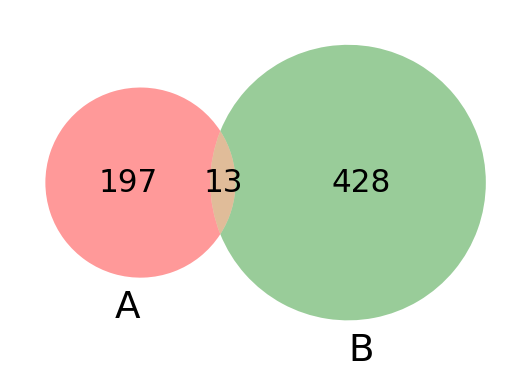

In [100]:
venn2([set(ol1), intersection])
plt.show()

In [102]:
for k in (set(ol1) & intersection):
    print(k)

MTRNR2L10
MTRNR2L3
PTTG2
PCDHGC3
SUMO4
NACA2
H3F3C
SND1.IT1
SMCR5
PDF
C4orf48
ATP5EP2
MTRNR2L6
